# EDA Mikołaj

## Wczytanie danych

In [1]:
import warnings

from pathlib import Path
from typing import Literal

import numpy as np
import pandas as pd
import nibabel as nib

from tqdm import tqdm
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [2]:
data_dir = Path("C:\\Users\\mikol\\OneDrive\\Pulpit\\ptp_dataset")
train_generated_dir = data_dir / "generated_part1_nii_gz" 
train_real_dir = data_dir / 'real_nii_gz' 

In [3]:
train_generated_data = [nib.load(path) for path in list(train_generated_dir.glob("*.nii.gz"))]
train_real_data = [nib.load(path) for path in list(train_real_dir.glob("*.nii.gz"))]

## Analiza wymiarów

In [4]:
len(train_generated_data)

25

In [5]:
len(train_real_data)

50

In [22]:
np.max(train_generated_data[0].get_fdata())

1633.0

In [23]:
np.min(train_generated_data[0].get_fdata())

-952.0

In [24]:
np.max(train_real_data[0].get_fdata())

4048.0

In [25]:
np.min(train_real_data[0].get_fdata())

-4027.0

Duża różnica pomiędzy przedziałami min - max.
W danych wygenerowanych max jest znacząco większy od wartości bezwględnej min, może to wpłynąć na jasność (większa wartość to bardziej ciemne tak mi sie wydaje).

In [6]:
for img in train_generated_data:
    print(img.shape)

(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)


In [7]:
for img in train_real_data:
    print(img.shape)

(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)
(300, 300, 1259)


## Podstawowe statystyki woluminów wygenerowanych oraz rzeczywistych

Jako że miałem duże problemy pamięciowe, to liczyłem średnią, odchylenie standardowe oraz mediane osobno dla każdego wolumina. Może jest to pewne przybliżenie, ale co zrobić. Przy okazji mając dane w takiej formie mogę zobaczyć jak wyglądają rozkłady tych statystyk.

In [12]:
generated_data_means = []
generated_data_stds = []
generated_data_median = []

for img in train_generated_data:
    data = img.get_fdata()
    generated_data_means.append(np.mean(data))
    generated_data_stds.append(np.std(data))
    generated_data_median.append(np.median(data))



(array([1., 2., 1., 2., 4., 2., 6., 2., 1., 4.]),
 array([-0.02087703, -0.01619374, -0.01151045, -0.00682717, -0.00214388,
         0.00253941,  0.0072227 ,  0.01190598,  0.01658927,  0.02127256,
         0.02595585]),
 <BarContainer object of 10 artists>)

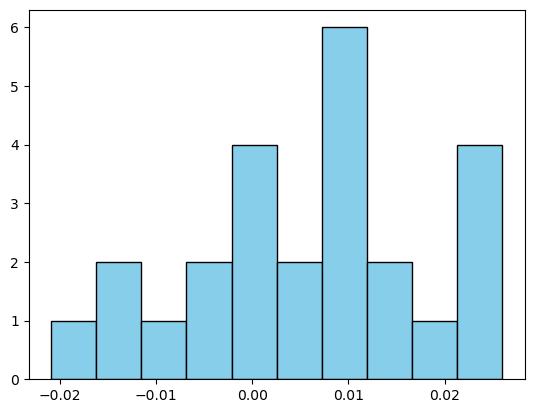

In [13]:
plt.hist(generated_data_means, color='skyblue', edgecolor='black')

(array([3., 2., 3., 8., 2., 3., 0., 1., 1., 2.]),
 array([99.71498037, 99.72210787, 99.72923537, 99.73636287, 99.74349036,
        99.75061786, 99.75774536, 99.76487286, 99.77200036, 99.77912785,
        99.78625535]),
 <BarContainer object of 10 artists>)

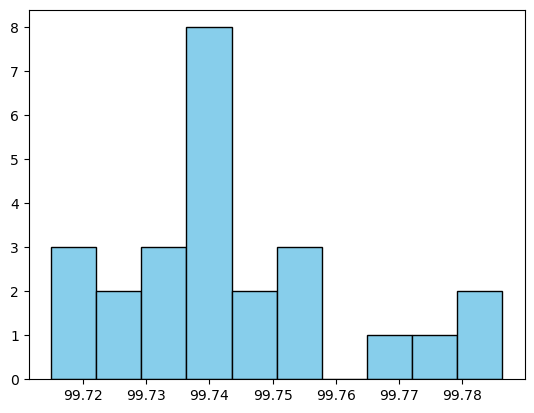

In [14]:
plt.hist(generated_data_stds, color='skyblue', edgecolor='black')

(array([ 2.,  0.,  0.,  0.,  0., 22.,  0.,  0.,  0.,  1.]),
 array([-1. , -0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <BarContainer object of 10 artists>)

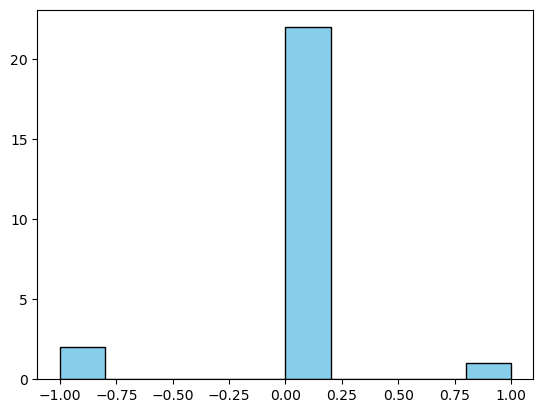

In [15]:
plt.hist(generated_data_median, color='skyblue', edgecolor='black')

In [19]:
print(f'Dane wygenerowane:\nŚrednia:{np.mean(generated_data_means)}\nMediana:{np.median(generated_data_median)}\nŚrednie std:{np.mean(generated_data_stds)}')

Dane wygenerowane:
Średnia:0.00570423334215868
Mediana:0.0
Średnie std:99.74400990247878


In [16]:
train_real_data_1 = train_real_data[0:len(train_real_data)//2]
train_real_data_2 = train_real_data[len(train_real_data)//2:]

In [17]:
real_data_means = []
real_data_stds = []
real_data_median = []

for img in train_real_data_1:
    data = img.get_fdata()
    real_data_means.append(np.mean(data))
    real_data_stds.append(np.std(data))
    real_data_median.append(np.median(data))

In [6]:
real_data_means_2 = []
real_data_stds_2 = []
real_data_median_2 = []

for img in train_real_data_2:
    data = img.get_fdata()
    real_data_means_2.append(np.mean(data))
    real_data_stds_2.append(np.std(data))
    real_data_median_2.append(np.median(data))

MemoryError: Unable to allocate 864. MiB for an array with shape (300, 300, 1259) and data type float64

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 24.]),
 array([-37.13223729, -33.36802117, -29.60380506, -25.83958894,
        -22.07537282, -18.31115671, -14.54694059, -10.78272448,
         -7.01850836,  -3.25429224,   0.50992387]),
 <BarContainer object of 10 artists>)

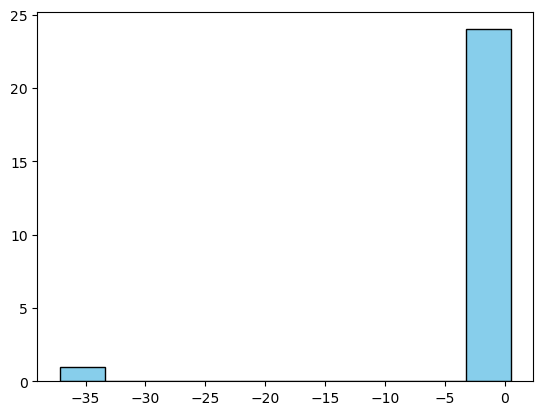

In [7]:
plt.hist(real_data_means, color='skyblue', edgecolor='black')

(array([14.,  9.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.]),
 array([ 135.68515844,  640.25242116, 1144.81968388, 1649.3869466 ,
        2153.95420932, 2658.52147204, 3163.08873476, 3667.65599748,
        4172.2232602 , 4676.79052292, 5181.35778564]),
 <BarContainer object of 10 artists>)

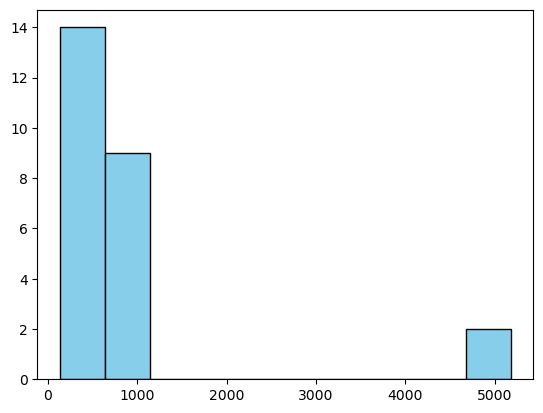

In [8]:
plt.hist(real_data_stds, color='skyblue', edgecolor='black')

(array([ 1.,  0.,  0.,  2.,  0.,  0.,  0.,  0.,  0., 22.]),
 array([-3. , -2.7, -2.4, -2.1, -1.8, -1.5, -1.2, -0.9, -0.6, -0.3,  0. ]),
 <BarContainer object of 10 artists>)

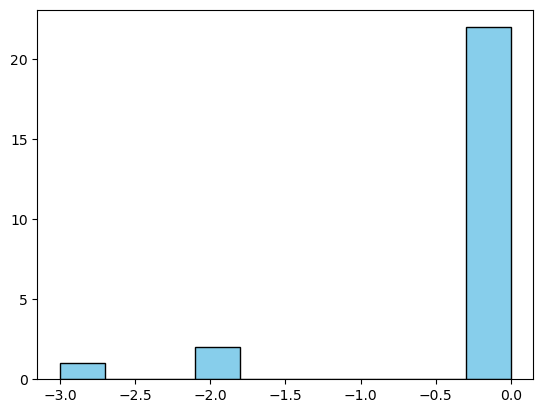

In [9]:
plt.hist(real_data_median, color='skyblue', edgecolor='black')

In [10]:
print(f'Dane prawdziwe:\nŚrednia:{np.mean(real_data_means)}\nMediana:{np.median(real_data_median)}\nŚrednie std:{np.mean(real_data_stds)}')

Dane prawdziwe:
Średnia:-1.952636863471891
Mediana:0.0
Średnie std:851.8835287931856


In [46]:
# szukam outliera ze średnia w binie -35 (patrz histogram średnich)
for idx, mean in enumerate(real_data_means):
    if mean < - 30:
        mean_outlier = idx
        break
        

In [49]:
# szukam outlierow ze średnia w binie 5000 (patrz histogram odchyleń)
std_outliers = []
for idx, std in enumerate(real_data_stds):
    if std > 4000:
        std_outliers.append(idx)
    

In [50]:
print(mean_outlier, std_outliers)

2 [2, 14]


### Obserwacje

Ze względów technicznych mogłem przeanalizować tylko pierwszą połowę danych prawdziwych. Pomiędzy danymi wygenerowanymi a prawdziwymi widać pewne różnice. Histogramy przedstawiające statystyki woluminów (średnia, mediana, odchylenie standardowe) w przypadku danych wygenerowanych wyglądają 'ładniej'. Na wykresach prawdziwych widać więcej outlierów, na przykład jeden wolumin ma odchylenie stanadrdowe równe 5000 oraz ma średnią równą -35. Standadrowe odchylenia w przypadku danych prawdziwych mają dużo większe wartości (Może warto byłoby znormalizować te dane, żeby łatwiej porównać je). Wynika to między innymi z maxymalnych wartości, które wyświetliłem wcześniej - generatywne mają mniejszy przedział przyjmowanych wartości niż prawdziwe. Mediany są takie same, a średnie są chyba podobne.

## Ilustracje przekrojów

### poziomy w środku
Statystyki odnoszą się do woluminu

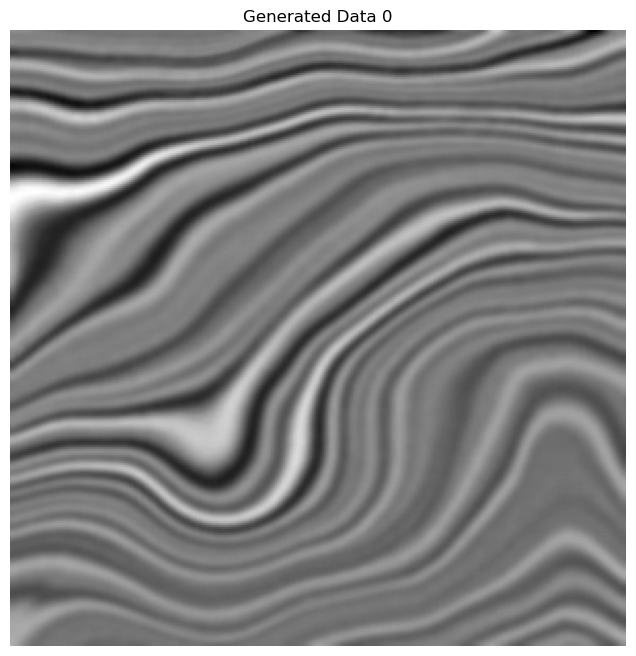

Wolumin 0 dane wygenrowane
Średnia: -0.015515047215603213
Mediana :0.0
Odchylenie Standardowe: 99.75571198733934


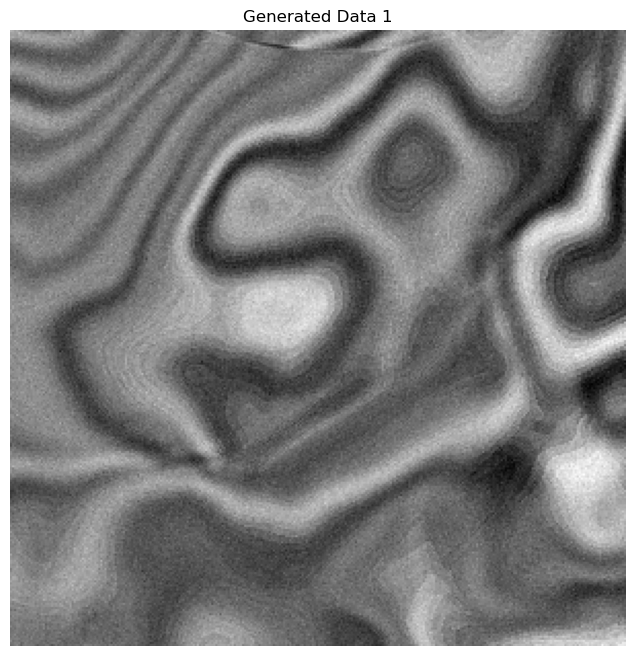

Wolumin 1 dane wygenrowane
Średnia: 0.0035139969993822255
Mediana :0.0
Odchylenie Standardowe: 99.73310357484252


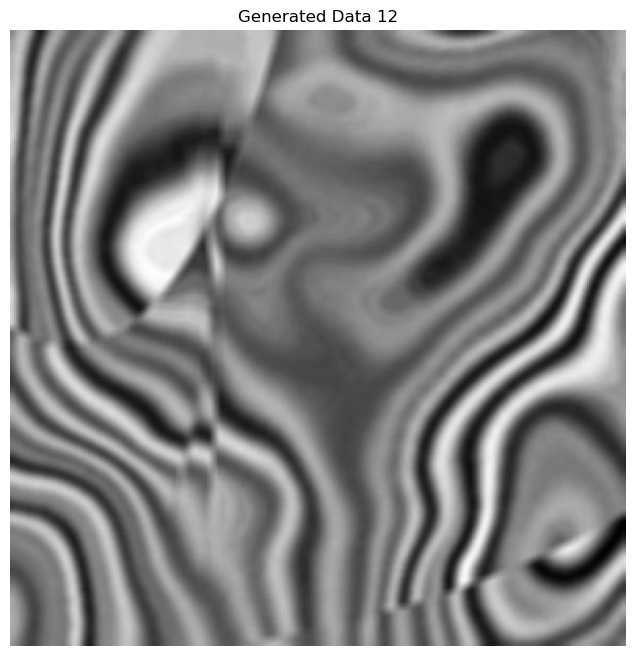

Wolumin 12 dane wygenrowane
Średnia: 0.0039613096814049955
Mediana :0.0
Odchylenie Standardowe: 99.76541549462021


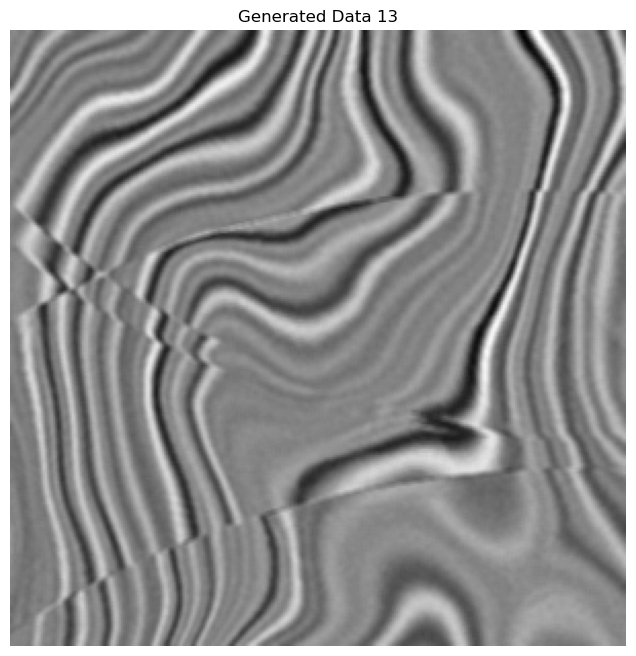

Wolumin 13 dane wygenrowane
Średnia: 0.011337357691289383
Mediana :0.0
Odchylenie Standardowe: 99.78082863200204


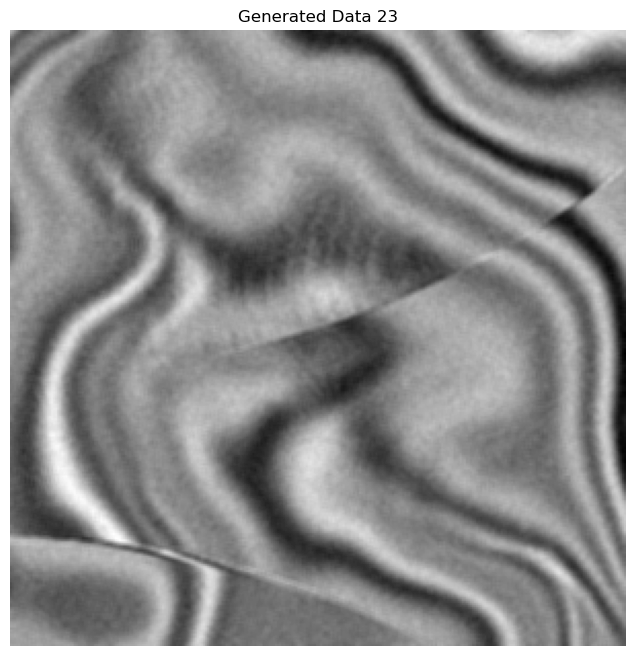

Wolumin 23 dane wygenrowane
Średnia: 0.009250516282764099
Mediana :0.0
Odchylenie Standardowe: 99.73723074968365


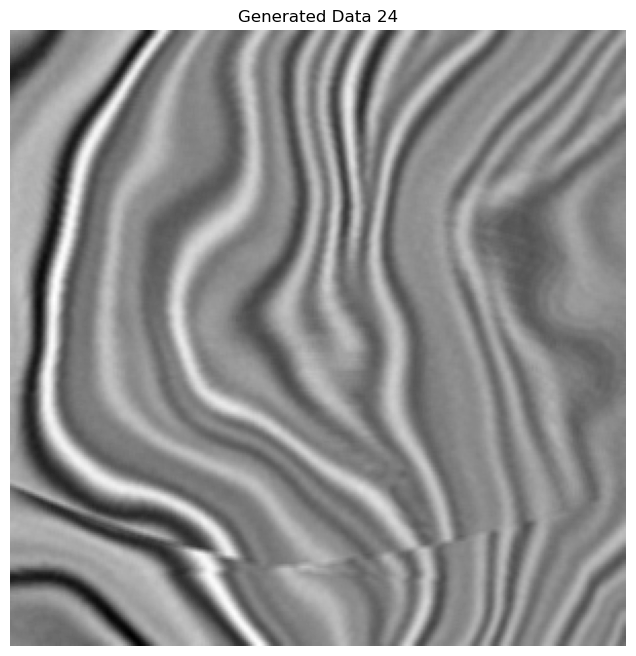

Wolumin 24 dane wygenrowane
Średnia: 0.017992657311799488
Mediana :0.0
Odchylenie Standardowe: 99.7572558425914


In [9]:
list = [0, 1, len(train_generated_data)//2, len(train_generated_data)//2 + 1, len(train_generated_data)-2, len(train_generated_data)-1]
for idx in list:
    img = train_generated_data[idx]
    data = img.get_fdata()

    z_slice = data.shape[2] // 2 
    plt.figure(figsize=(8, 8))
    plt.imshow(data[:, :, z_slice], cmap='gray')
    plt.title(f"Generated Data {idx}")
    plt.axis('off')
    plt.show()
    print(f'Wolumin {idx} dane wygenrowane\nŚrednia: {np.mean(data)}\nMediana :{np.median(data)}\nOdchylenie Standardowe: {np.std(data)}')

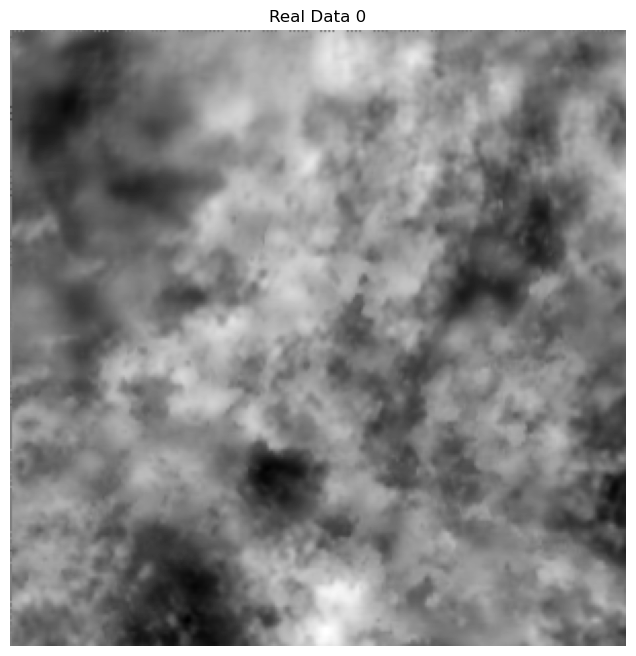

Wolumin 0 dane rzeczywiste
Średnia: -0.1444955167240314
Mediana :0.0
Odchylenie Standardowe: 337.0958128571561


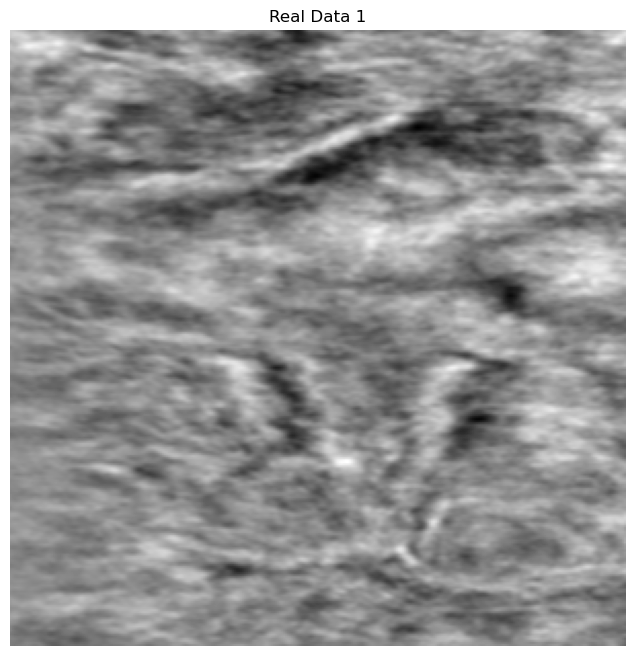

Wolumin 1 dane rzeczywiste
Średnia: -1.1190550613361574
Mediana :0.0
Odchylenie Standardowe: 335.0518035155919


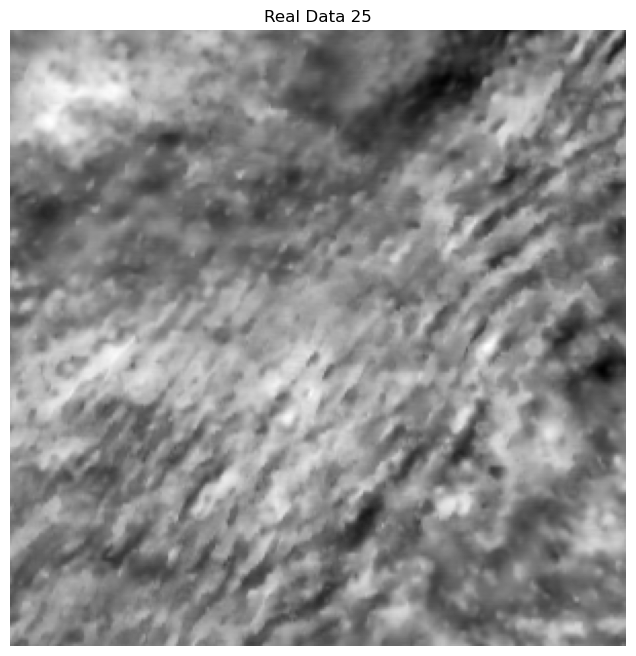

Wolumin 25 dane rzeczywiste
Średnia: -0.012081749183655458
Mediana :0.0
Odchylenie Standardowe: 163.47363135476138


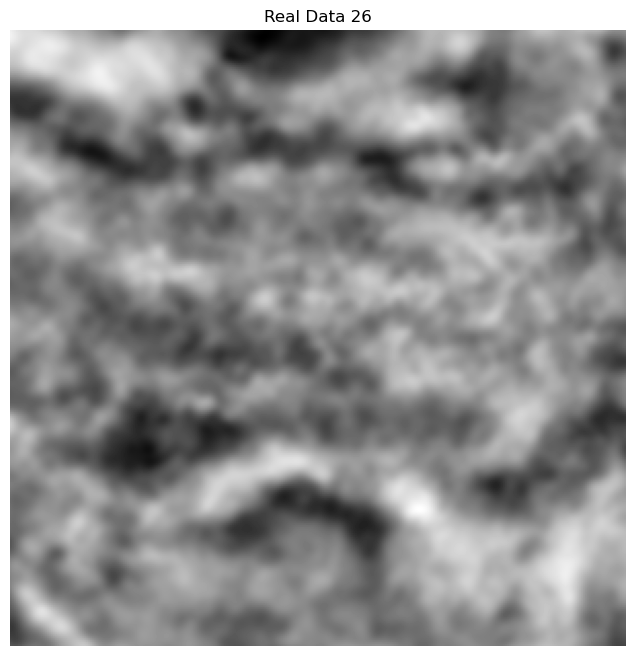

Wolumin 26 dane rzeczywiste
Średnia: 0.26325852969729063
Mediana :0.0
Odchylenie Standardowe: 840.5062820925976


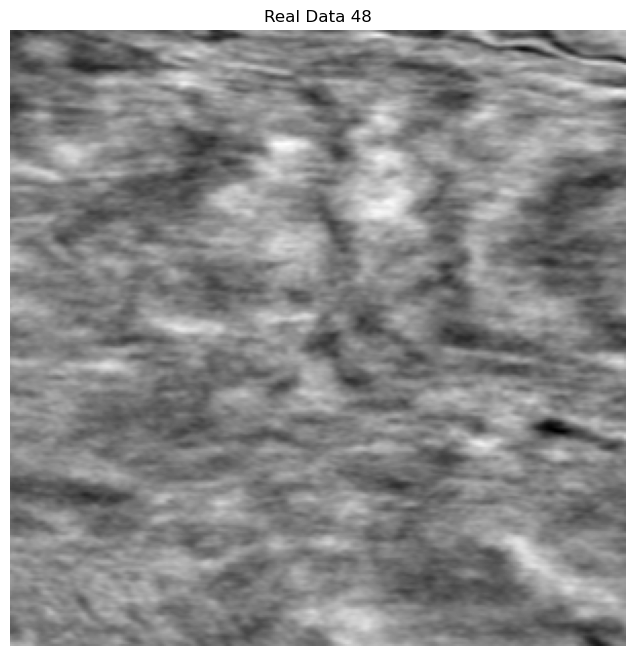

Wolumin 48 dane rzeczywiste
Średnia: -1.3254869649633747
Mediana :0.0
Odchylenie Standardowe: 322.098735804552


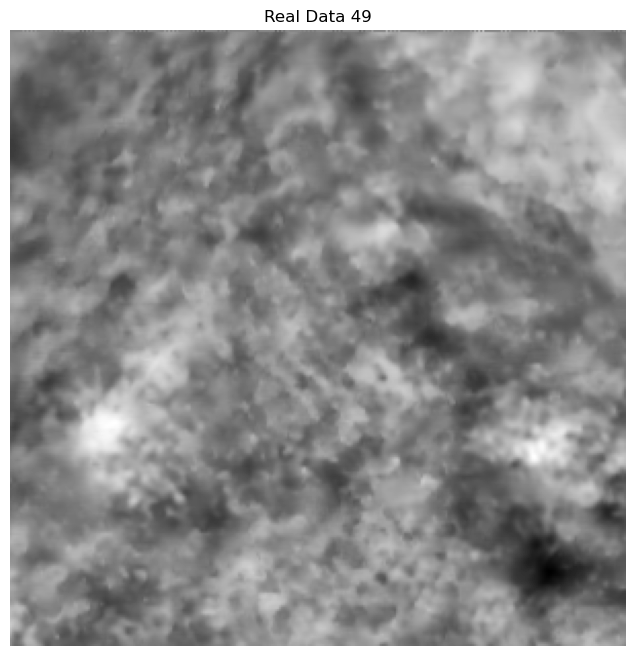

Wolumin 49 dane rzeczywiste
Średnia: -0.019995490247992232
Mediana :0.0
Odchylenie Standardowe: 142.3471536345387


In [12]:
list = [0, 1, len(train_real_data)//2, len(train_real_data)//2 + 1, len(train_real_data)-2, len(train_real_data)-1]
for idx in list:
    img = train_real_data[idx]
    data = img.get_fdata()

    z_slice = data.shape[2] // 2 
    plt.figure(figsize=(8, 8))
    plt.imshow(data[:, :, z_slice], cmap='gray')
    plt.title(f"Real Data {idx}")
    plt.axis('off')
    plt.show()
    print(f'Wolumin {idx} dane rzeczywiste\nŚrednia: {np.mean(data)}\nMediana :{np.median(data)}\nOdchylenie Standardowe: {np.std(data)}')

### poziomy od góry
Statystyki odnoszą się do przekroju

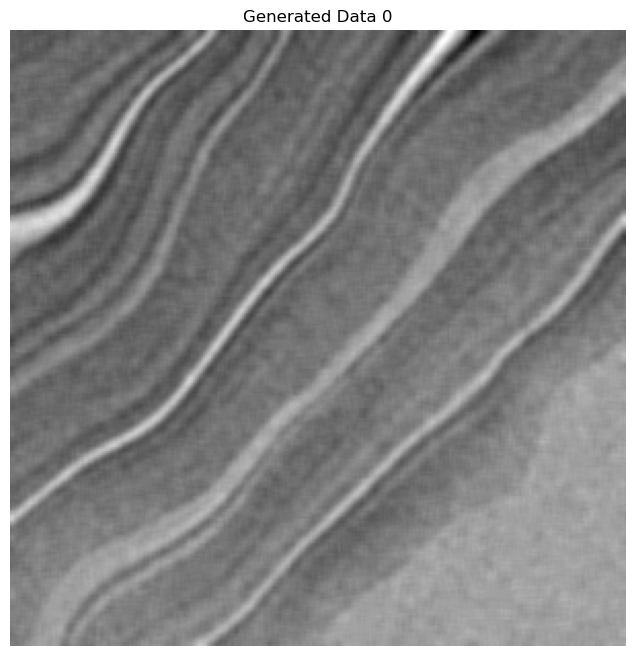

Wolumin 0 dane wygenrowane
Średnia: -37.85434444444444
Mediana :-43.0
Odchylenie Standardowe: 26.23624922407974


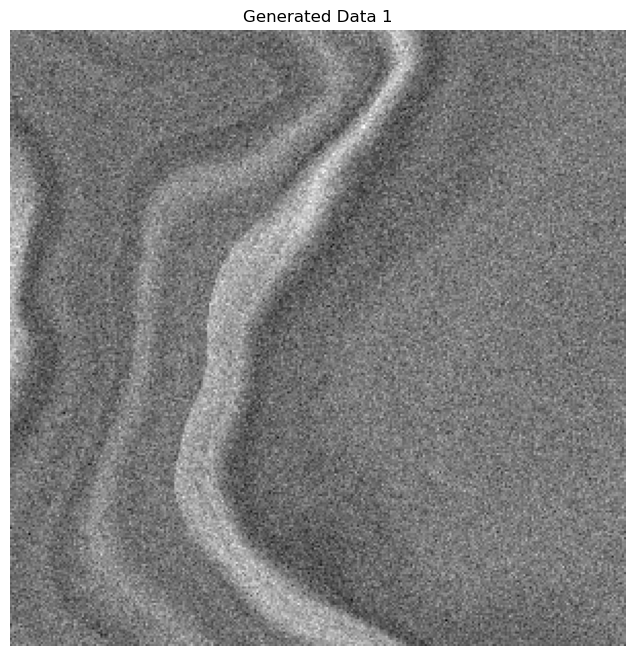

Wolumin 1 dane wygenrowane
Średnia: 1.7976777777777777
Mediana :0.0
Odchylenie Standardowe: 34.519596514098666


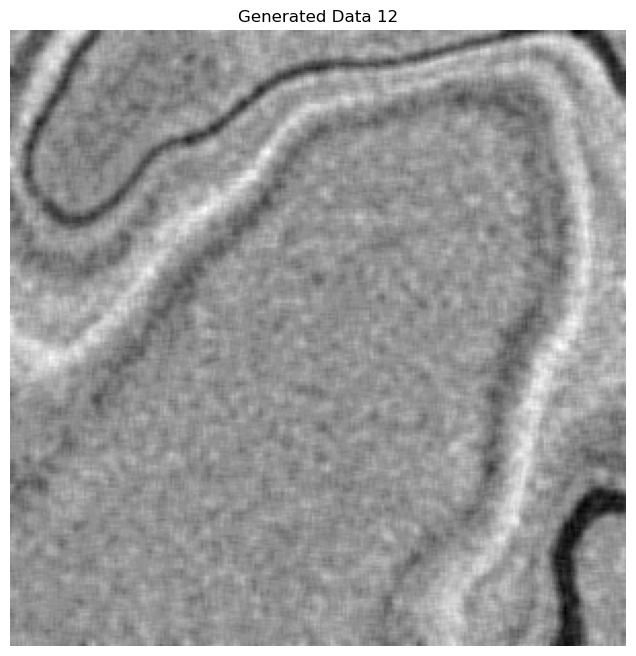

Wolumin 12 dane wygenrowane
Średnia: 0.5524555555555556
Mediana :0.0
Odchylenie Standardowe: 7.098615168015536


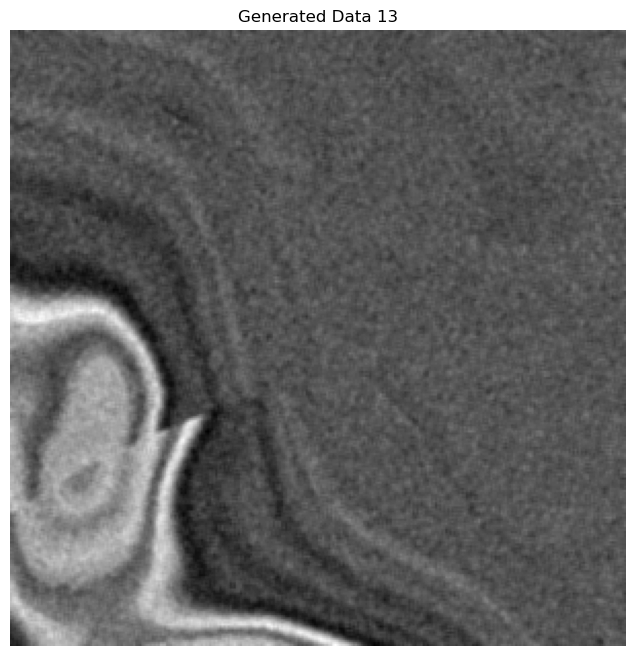

Wolumin 13 dane wygenrowane
Średnia: 6.181466666666667
Mediana :1.0
Odchylenie Standardowe: 25.066734992460074


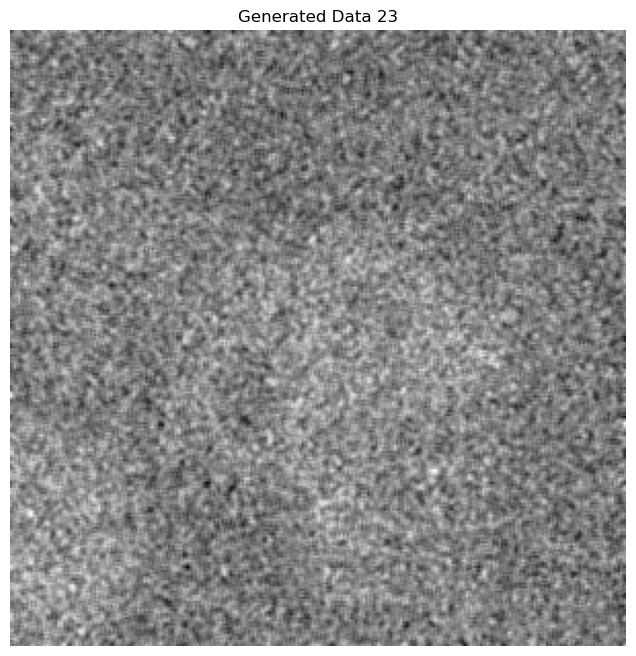

Wolumin 23 dane wygenrowane
Średnia: 1.174711111111111
Mediana :1.0
Odchylenie Standardowe: 5.879426316013502


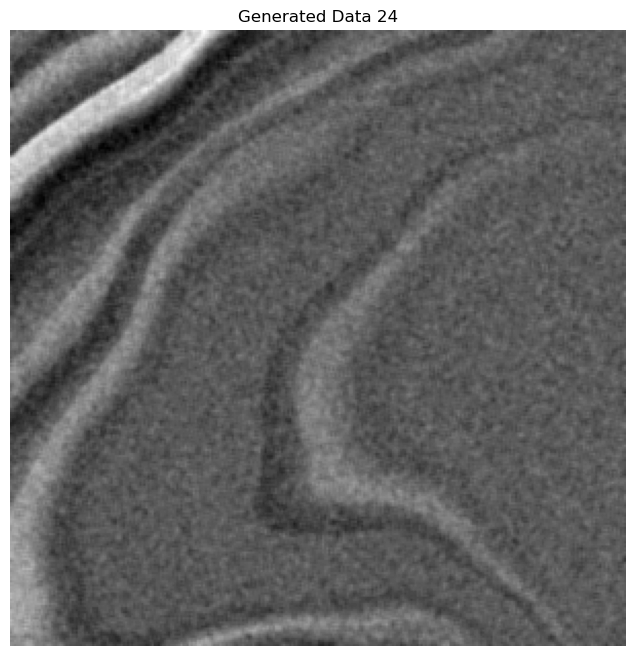

Wolumin 24 dane wygenrowane
Średnia: 0.8936111111111111
Mediana :0.0
Odchylenie Standardowe: 14.855810807143927


In [57]:
list = [0, 1, len(train_generated_data)//2, len(train_generated_data)//2 + 1, len(train_generated_data)-2, len(train_generated_data)-1]
for idx in list:
    img = train_generated_data[idx]
    data = img.get_fdata()
    data = data[:, :, 1258]

    plt.figure(figsize=(8, 8))
    plt.imshow(data, cmap='gray')
    plt.title(f"Generated Data {idx}")
    plt.axis('off')
    plt.show()
    print(f'Wolumin {idx} dane wygenrowane\nŚrednia: {np.mean(data)}\nMediana :{np.median(data)}\nOdchylenie Standardowe: {np.std(data)}')

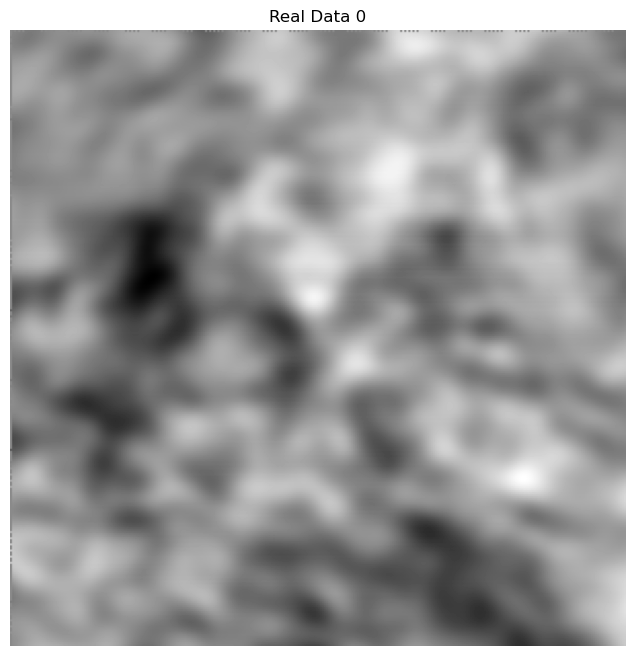

Wolumin 0 dane rzeczywiste
Średnia: 22.97232222222222
Mediana :32.0
Odchylenie Standardowe: 197.95099994287744


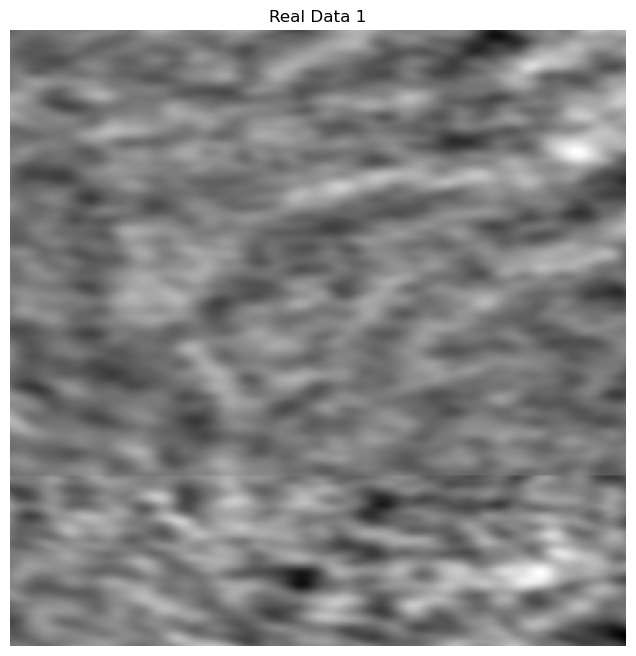

Wolumin 1 dane rzeczywiste
Średnia: 6.406166666666667
Mediana :1.0
Odchylenie Standardowe: 89.29034062337811


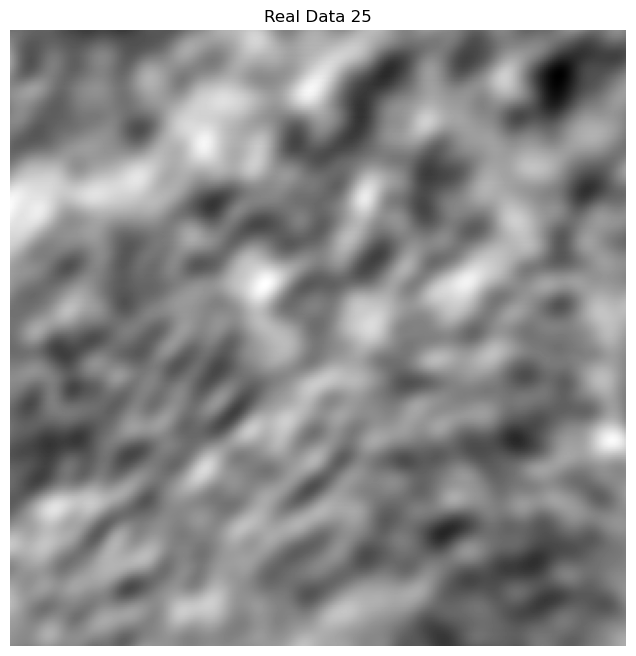

Wolumin 25 dane rzeczywiste
Średnia: -0.013711111111111111
Mediana :-4.0
Odchylenie Standardowe: 113.71794449819396


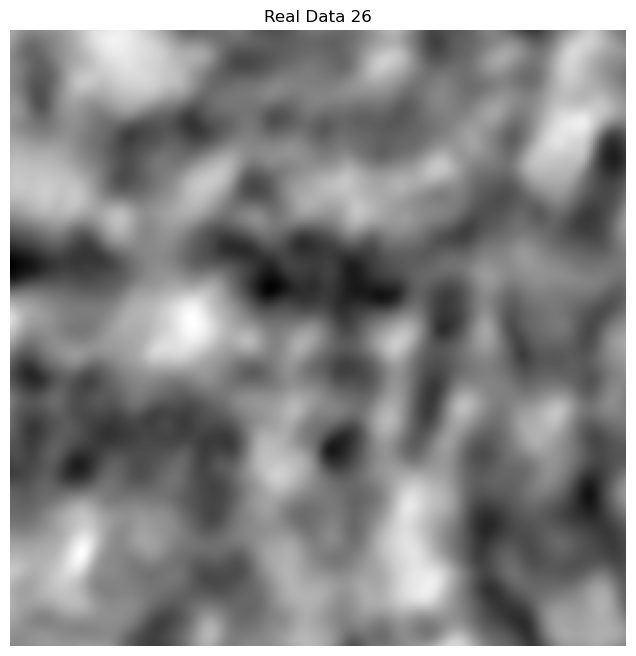

Wolumin 26 dane rzeczywiste
Średnia: 25.851133333333333
Mediana :-11.0
Odchylenie Standardowe: 874.2340673061852


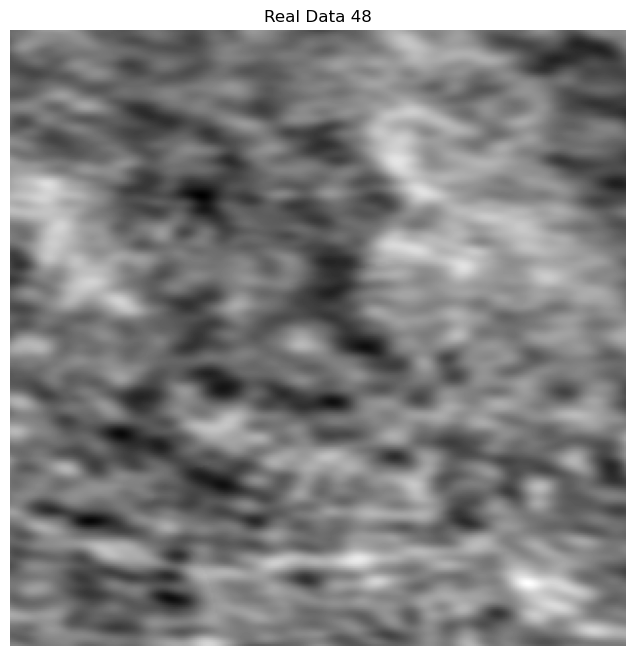

Wolumin 48 dane rzeczywiste
Średnia: 2.420933333333333
Mediana :0.0
Odchylenie Standardowe: 167.40145218278923


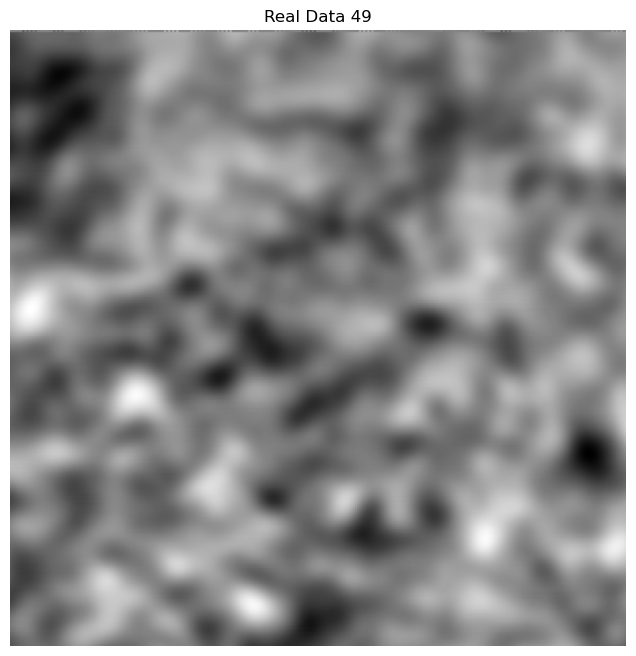

Wolumin 49 dane rzeczywiste
Średnia: -8.822577777777777
Mediana :-9.0
Odchylenie Standardowe: 66.3211141946645


In [58]:
list = [0, 1, len(train_real_data)//2, len(train_real_data)//2 + 1, len(train_real_data)-2, len(train_real_data)-1]
for idx in list:
    img = train_real_data[idx]
    data = img.get_fdata()
    data = data[:, :, 1258]

    plt.figure(figsize=(8, 8))
    plt.imshow(data, cmap='gray')
    plt.title(f"Real Data {idx}")
    plt.axis('off')
    plt.show()
    print(f'Wolumin {idx} dane rzeczywiste\nŚrednia: {np.mean(data)}\nMediana :{np.median(data)}\nOdchylenie Standardowe: {np.std(data)}')

### pionowy 1
Statystyki odnoszą się do przekroju

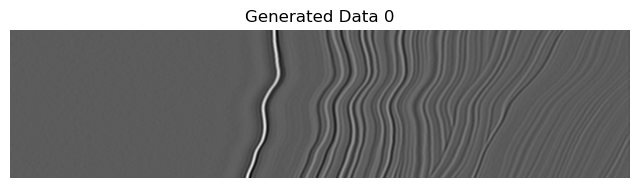

Wolumin 0 dane wygenrowane
Średnia: -0.02786603124172624
Mediana :0.0
Odchylenie Standardowe: 111.36723987472881


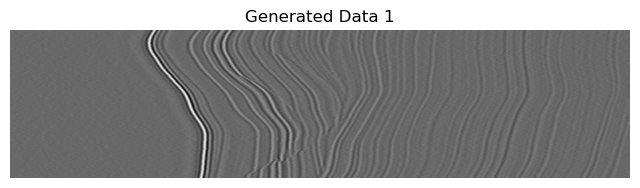

Wolumin 1 dane wygenrowane
Średnia: -0.01160974318241991
Mediana :0.0
Odchylenie Standardowe: 99.50095011395766


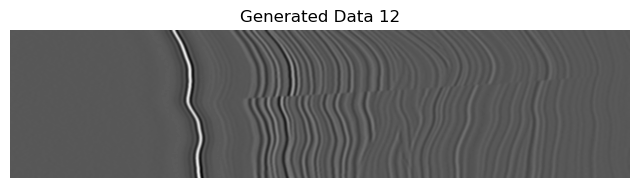

Wolumin 12 dane wygenrowane
Średnia: 4.500926661371459e-05
Mediana :0.0
Odchylenie Standardowe: 100.15806521460492


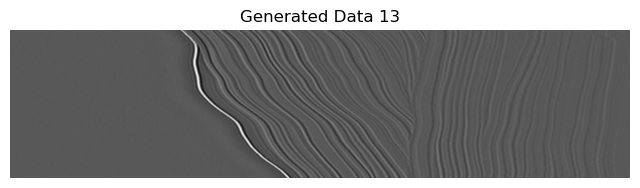

Wolumin 13 dane wygenrowane
Średnia: -0.004058776806989674
Mediana :0.0
Odchylenie Standardowe: 107.48961598723442


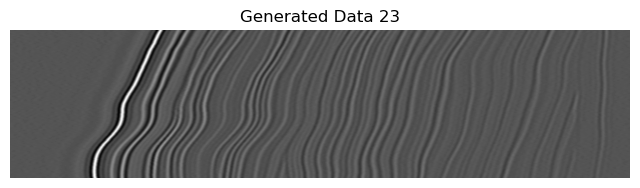

Wolumin 23 dane wygenrowane
Średnia: 0.012033359809372517
Mediana :0.0
Odchylenie Standardowe: 100.82401710912762


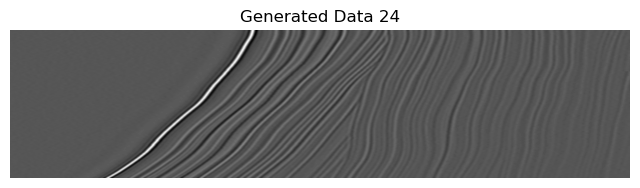

Wolumin 24 dane wygenrowane
Średnia: 0.02552025416997617
Mediana :0.0
Odchylenie Standardowe: 100.88947148607167


In [52]:
list = [0, 1, len(train_generated_data)//2, len(train_generated_data)//2 + 1, len(train_generated_data)-2, len(train_generated_data)-1]
for idx in list:
    img = train_generated_data[idx]
    data = img.get_fdata()
    data = data[0, :, :]

    plt.figure(figsize=(8, 8))
    plt.imshow(data, cmap='gray')
    plt.title(f"Generated Data {idx}")
    plt.axis('off')
    plt.show()
    print(f'Wolumin {idx} dane wygenrowane\nŚrednia: {np.mean(data)}\nMediana :{np.median(data)}\nOdchylenie Standardowe: {np.std(data)}')

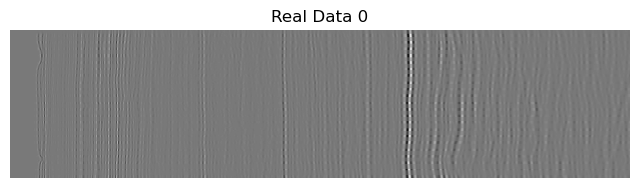

Wolumin 0 dane rzeczywiste
Średnia: -0.010585120465978289
Mediana :0.0
Odchylenie Standardowe: 255.40322764970267


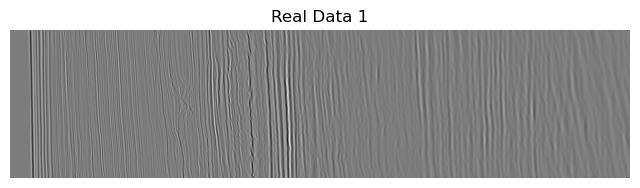

Wolumin 1 dane rzeczywiste
Średnia: -0.3379957638337305
Mediana :0.0
Odchylenie Standardowe: 372.6544626898706


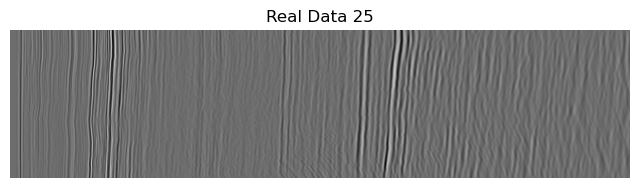

Wolumin 25 dane rzeczywiste
Średnia: -0.061326449563145355
Mediana :0.0
Odchylenie Standardowe: 170.25798854914646


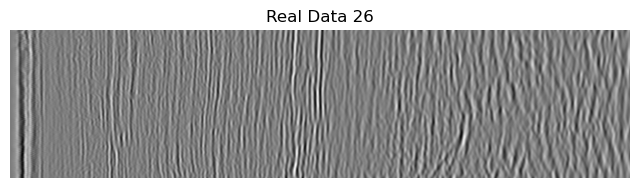

Wolumin 26 dane rzeczywiste
Średnia: 2.476690495101933
Mediana :8.0
Odchylenie Standardowe: 836.9193227248886


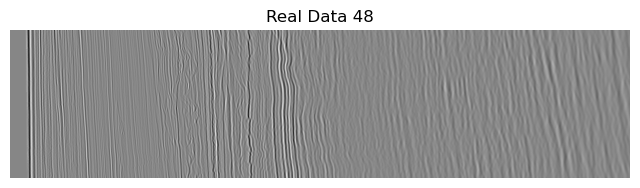

Wolumin 48 dane rzeczywiste
Średnia: -0.7759650516282764
Mediana :0.0
Odchylenie Standardowe: 312.70158274839474


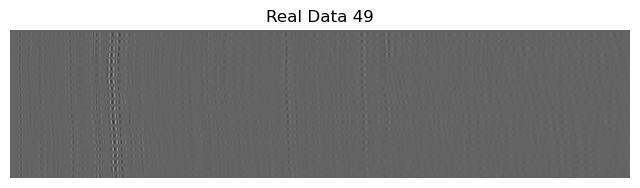

Wolumin 49 dane rzeczywiste
Średnia: 0.0016282764098490866
Mediana :0.0
Odchylenie Standardowe: 68.26667654344268


In [53]:
list = [0, 1, len(train_real_data)//2, len(train_real_data)//2 + 1, len(train_real_data)-2, len(train_real_data)-1]
for idx in list:
    img = train_real_data[idx]
    data = img.get_fdata()
    data = data[0, :, :]


    plt.figure(figsize=(8, 8))
    plt.imshow(data, cmap='gray')
    plt.title(f"Real Data {idx}")
    plt.axis('off')
    plt.show()
    print(f'Wolumin {idx} dane rzeczywiste\nŚrednia: {np.mean(data)}\nMediana :{np.median(data)}\nOdchylenie Standardowe: {np.std(data)}')

### Pionowy 2
Statystyki odnoszą się do przekroju

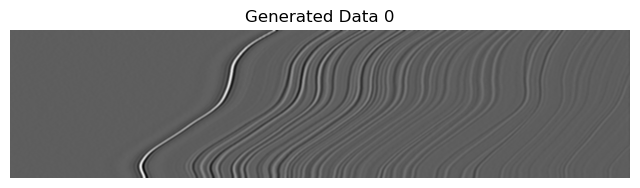

Wolumin 0 dane wygenrowane
Średnia: -0.021098755626158327
Mediana :0.0
Odchylenie Standardowe: 106.3834242960639


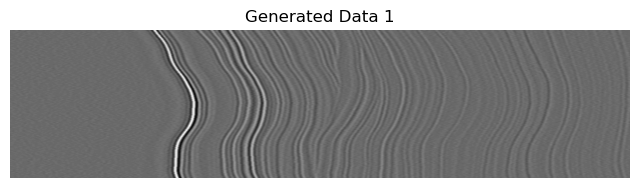

Wolumin 1 dane wygenrowane
Średnia: 0.021485305798252582
Mediana :0.0
Odchylenie Standardowe: 98.18889470444046


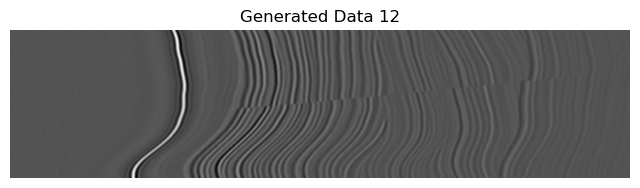

Wolumin 12 dane wygenrowane
Średnia: 0.007892507280910776
Mediana :0.0
Odchylenie Standardowe: 94.3067811945446


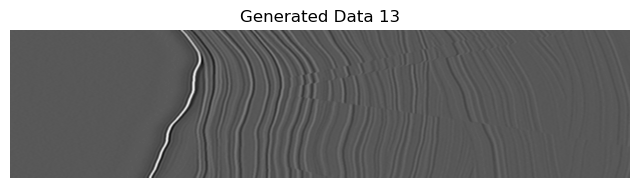

Wolumin 13 dane wygenrowane
Średnia: 0.03233518665607625
Mediana :0.0
Odchylenie Standardowe: 104.87818820347205


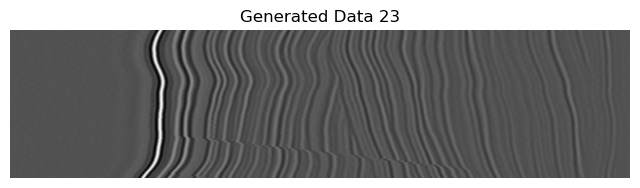

Wolumin 23 dane wygenrowane
Średnia: 0.01662165740005295
Mediana :0.0
Odchylenie Standardowe: 97.02377941467181


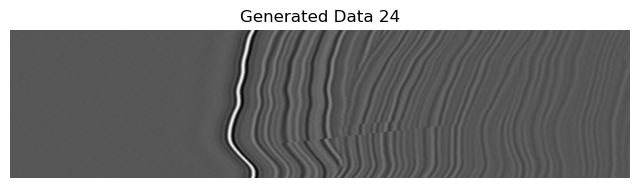

Wolumin 24 dane wygenrowane
Średnia: 0.011376754037595976
Mediana :0.0
Odchylenie Standardowe: 102.1913368141735


In [55]:
list = [0, 1, len(train_generated_data)//2, len(train_generated_data)//2 + 1, len(train_generated_data)-2, len(train_generated_data)-1]
for idx in list:
    img = train_generated_data[idx]
    data = img.get_fdata()
    data = data[:, 0, :]

    plt.figure(figsize=(8, 8))
    plt.imshow(data, cmap='gray')
    plt.title(f"Generated Data {idx}")
    plt.axis('off')
    plt.show()
    print(f'Wolumin {idx} dane wygenrowane\nŚrednia: {np.mean(data)}\nMediana :{np.median(data)}\nOdchylenie Standardowe: {np.std(data)}')

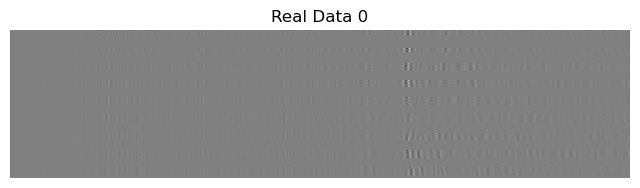

Wolumin 0 dane rzeczywiste
Średnia: -0.01539316918189039
Mediana :0.0
Odchylenie Standardowe: 95.81886782659421


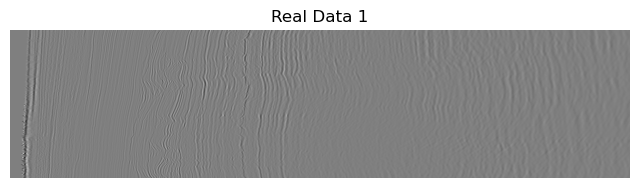

Wolumin 1 dane rzeczywiste
Średnia: -0.6177151178183744
Mediana :0.0
Odchylenie Standardowe: 204.64733819321674


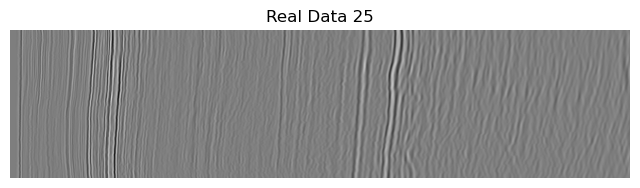

Wolumin 25 dane rzeczywiste
Średnia: -0.05621657400052952
Mediana :0.0
Odchylenie Standardowe: 164.71185822123041


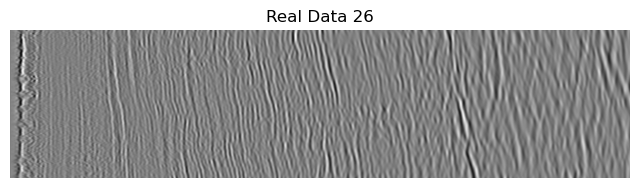

Wolumin 26 dane rzeczywiste
Średnia: 1.1574662430500398
Mediana :-1.0
Odchylenie Standardowe: 837.1035562117348


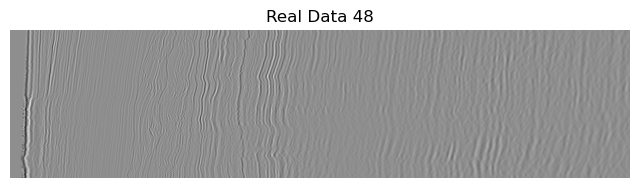

Wolumin 48 dane rzeczywiste
Średnia: -1.7457532433148002
Mediana :0.0
Odchylenie Standardowe: 323.86392531928396


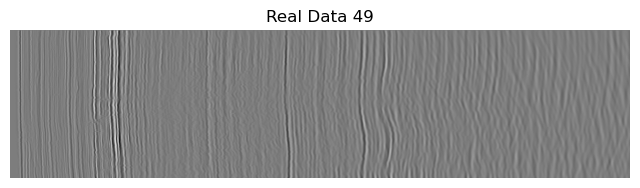

Wolumin 49 dane rzeczywiste
Średnia: -0.013640455387873974
Mediana :0.0
Odchylenie Standardowe: 144.1595837823658


In [56]:
list = [0, 1, len(train_real_data)//2, len(train_real_data)//2 + 1, len(train_real_data)-2, len(train_real_data)-1]
for idx in list:
    img = train_real_data[idx]
    data = img.get_fdata()
    data = data[:, 0, :]

    plt.figure(figsize=(8, 8))
    plt.imshow(data, cmap='gray')
    plt.title(f"Real Data {idx}")
    plt.axis('off')
    plt.show()
    print(f'Wolumin {idx} dane rzeczywiste\nŚrednia: {np.mean(data)}\nMediana :{np.median(data)}\nOdchylenie Standardowe: {np.std(data)}')

### Outliery z danych rzeczywistch (mean~-35, std~5000)

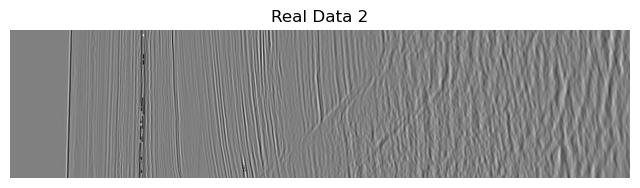

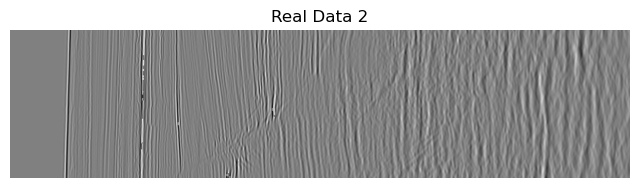

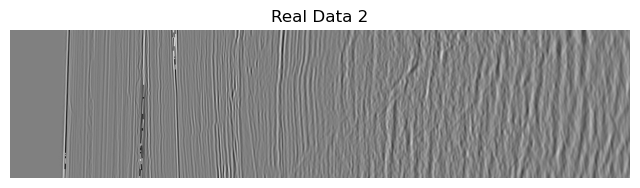

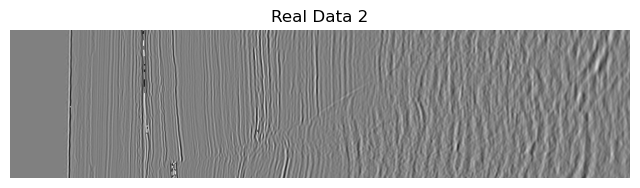

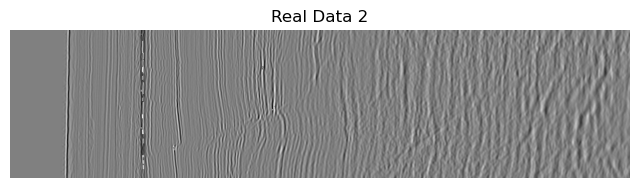

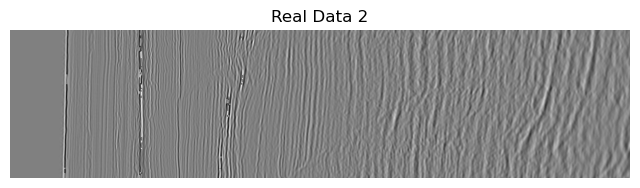

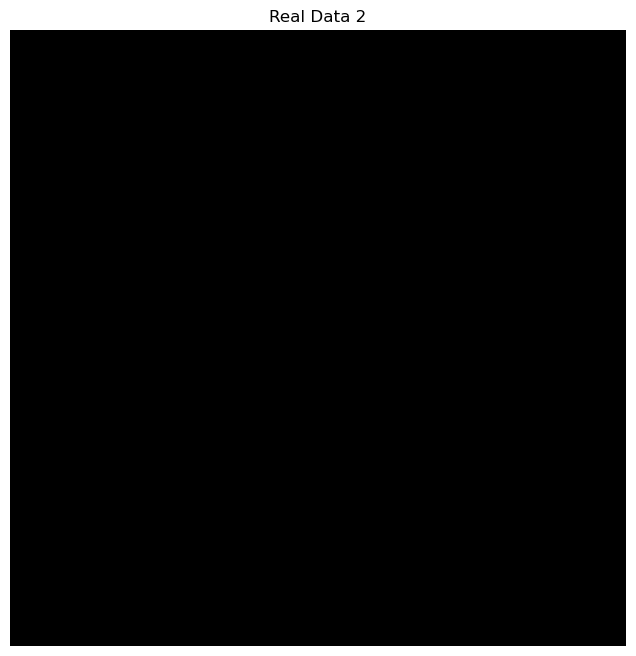

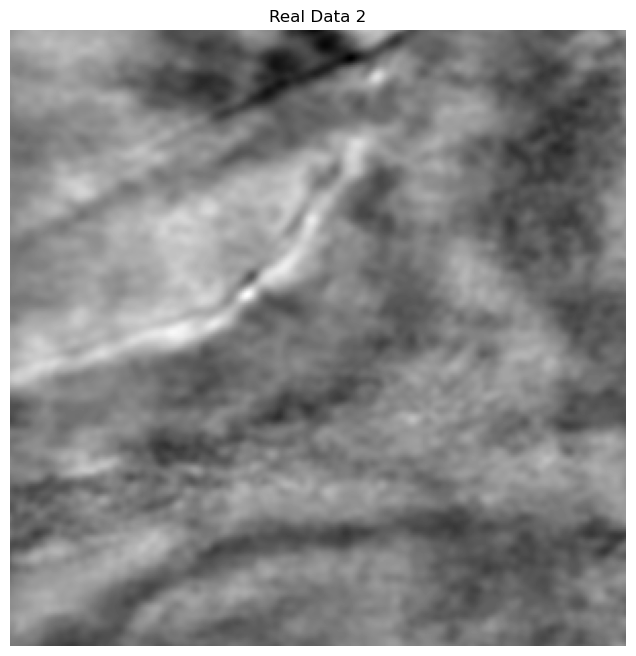

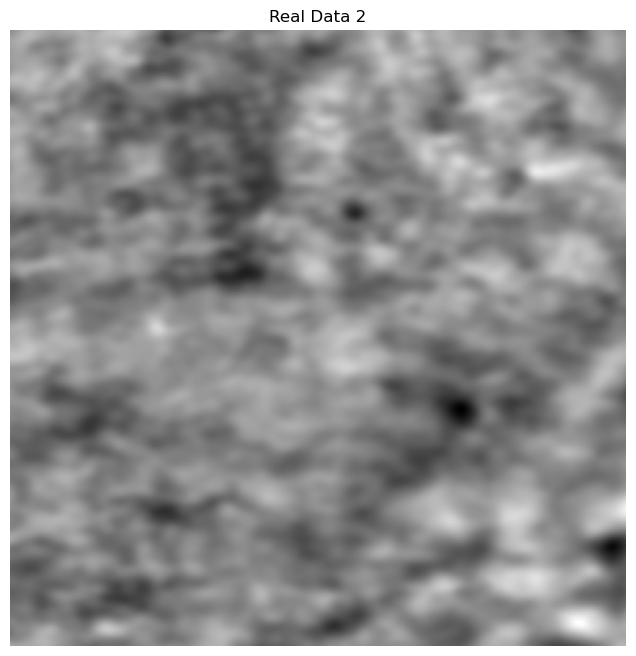

In [36]:
slices = [[0, x//2, x-1] for x in train_generated_data[0].shape]

# outlier 1
for i in range(3):
    for j in range(3):
        if i == 0:
            img = train_real_data[mean_outlier]
            data = img.get_fdata()

            plt.figure(figsize=(8, 8))
            plt.imshow(data[slices[i][j], :, :], cmap='gray')
            plt.title(f"Real Data {idx}")
            plt.axis('off')
            plt.show()
        elif i == 1:
            img = train_real_data[mean_outlier]
            data = img.get_fdata()

            plt.figure(figsize=(8, 8))
            plt.imshow(data[:, slices[i][j], :], cmap='gray')
            plt.title(f"Real Data {idx}")
            plt.axis('off')
            plt.show()
        else:
            img = train_real_data[mean_outlier]
            data = img.get_fdata()

            plt.figure(figsize=(8, 8))
            plt.imshow(data[:, :, slices[i][j]], cmap='gray')
            plt.title(f"Real Data {idx}")
            plt.axis('off')
            plt.show()           
    
    

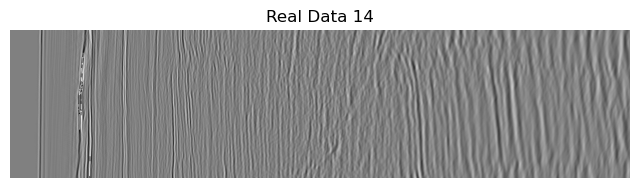

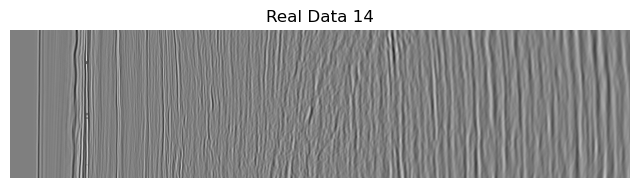

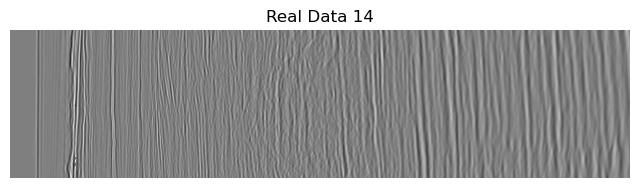

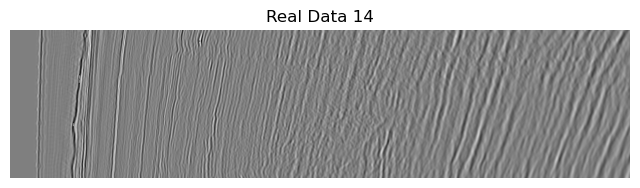

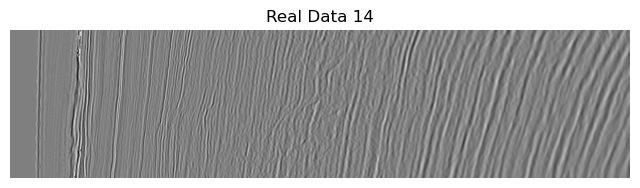

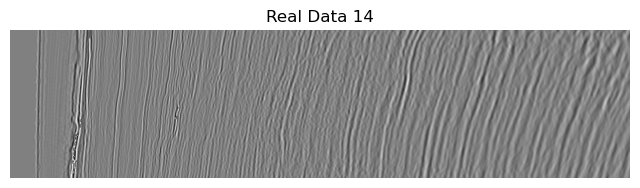

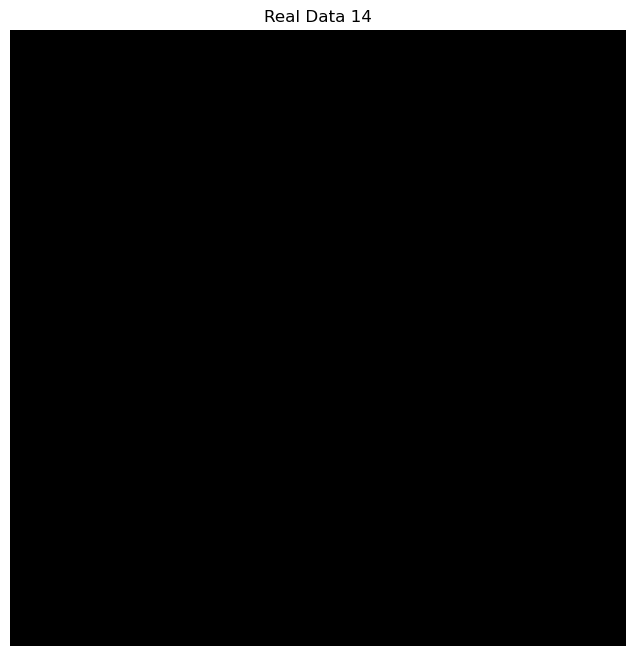

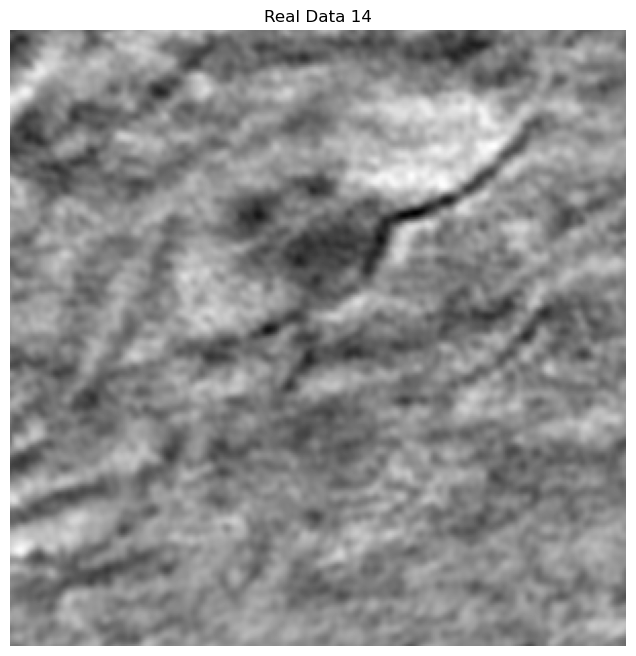

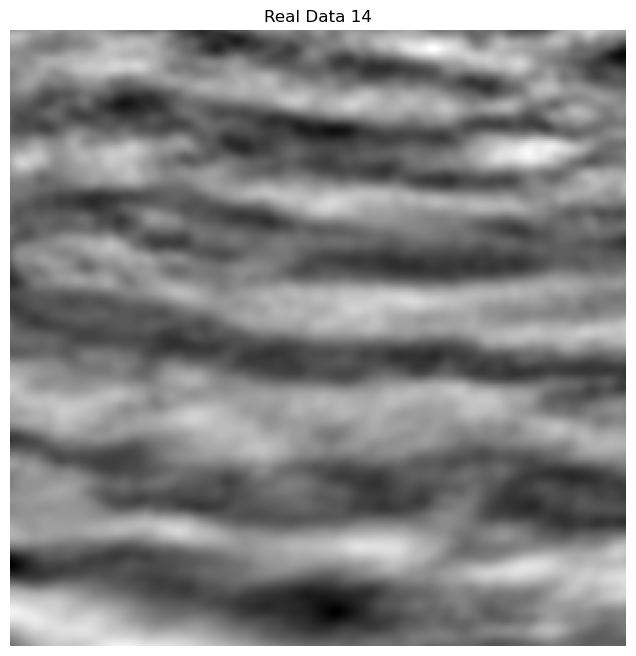

In [51]:
# outlier 2 
for i in range(3):
    for j in range(3):
        if i == 0:
            img = train_real_data[std_outliers[1]]
            data = img.get_fdata()

            plt.figure(figsize=(8, 8))
            plt.imshow(data[slices[i][j], :, :], cmap='gray')
            plt.title(f"Real Data {std_outliers[1]}")
            plt.axis('off')
            plt.show()
        elif i == 1:
            img = train_real_data[std_outliers[1]]
            data = img.get_fdata()

            plt.figure(figsize=(8, 8))
            plt.imshow(data[:, slices[i][j], :], cmap='gray')
            plt.title(f"Real Data {std_outliers[1]}")
            plt.axis('off')
            plt.show()
        else:
            img = train_real_data[std_outliers[1]]
            data = img.get_fdata()

            plt.figure(figsize=(8, 8))
            plt.imshow(data[:, :, slices[i][j]], cmap='gray')
            plt.title(f"Real Data {std_outliers[1]}")
            plt.axis('off')
            plt.show()  

### Obserwacje

Statystyki poszczególnych przekrojów nie odbiegają od statystyk dla całego woluminu.

Widać znaczne różnice na przekrojach pomiędzy rzeczywistymi danymi a wygenerowanymi:
- W poziomie na danych wygenerowanych widać wzorce na pierwszy rzut oka, a na rzeczywistych jest większy chaos.
- W pionie na danych wygenerowanych znowu widać wzorce oraz krzywe mają większą krzywiznę, na rzeczywistych są one bardziej proste.

Ciekawie wygląda przekrój pionowy nr 1 dla danych prawdziwych dla 50 woluminu (49 w indeksacji Pythona), jest bardzo rozmyty. Podobnie 1 również z danych prawdziwycch dla pionowego 2. Statystyki średniego odchylenia w przypadku tych przekrojów są niskie w porównianiu z pozostałymi. 

Natomiast na ilustracjach outlierów można zauważyć większą falistość (odwrotność tego co w przypadkach wyżej), stąd też wynika ich duże std.


## Brak % sekcji

In [18]:
from ptp.utils import training_data_generator, scoring, create_submission, create_single_submission

In [19]:
def func(img, axis, z, percentile=25):
    seismic, target, target_mask = training_data_generator(seismic=img.get_fdata(), axis=axis, percentile=percentile)
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(seismic[...,z], cmap='gray')
    ax[0].set_title('Seismic')
    ax[1].imshow(target[...,z], cmap='gray')
    ax[1].set_title('Target')
    ax[2].imshow(target_mask[...,z], cmap='gray')
    ax[2].set_title('Target Mask')
    plt.show()

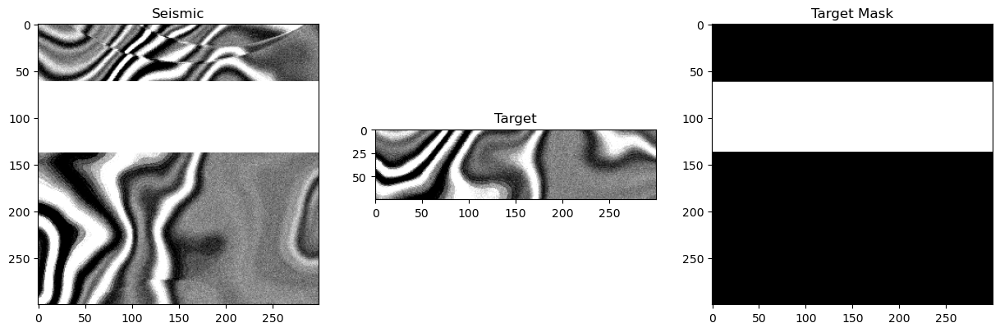

In [21]:
func(train_generated_data[1], 'i_line', 500)

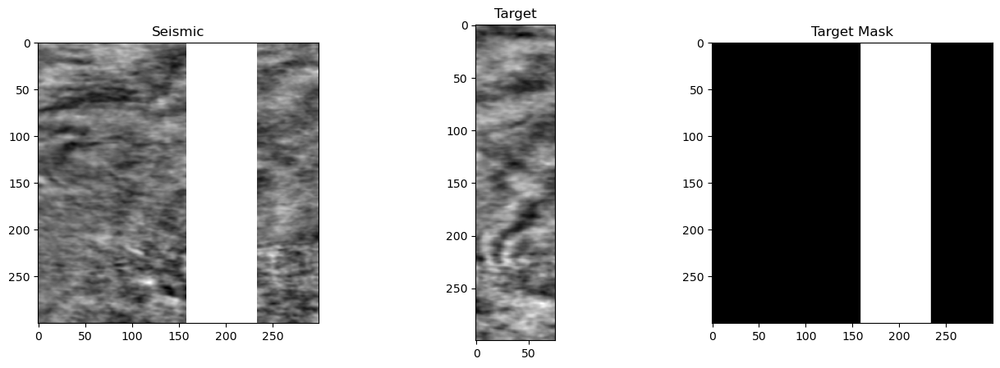

In [22]:
func(train_real_data[1], 'x_line', 800)

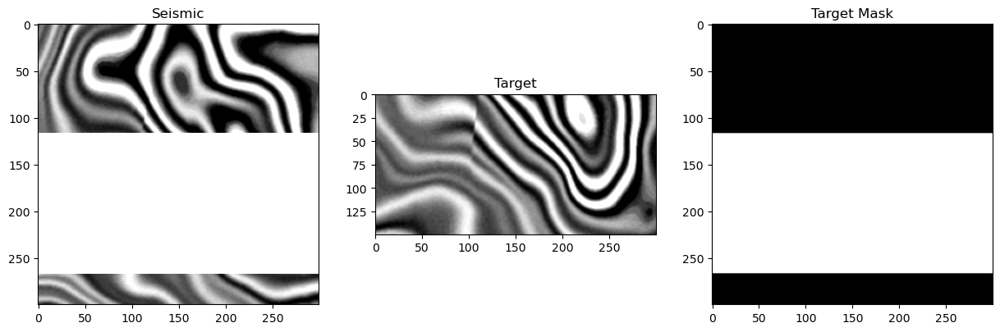

In [23]:
func(train_generated_data[2], 'i_line', 500, 50)

## Slicer

### Wygenerowane

<img style="width: 50%;" src="../images/mikolaj/generated_1.png">

<img style="width: 50%;" src="../images/mikolaj/generated_2.png">

<img style="width: 50%;" src="../images/mikolaj/generated_3.png">




### Prawdziwe

<img style="width: 50%;" src="../images/mikolaj/real_1.png">

<img style="width: 50%;" src="../images/mikolaj/real_2.png">

<img style="width: 50%;" src="../images/mikolaj/real_3.png">

<img style="width: 50%;" src="../images/mikolaj/real_4.png">

## Wnioski



Na wizualizacjach (slicer, matplotlib) można zobaczyć dużą róznicę pomiędzy danymi wygenerowanymi oraz prawdziwymi. Dane wygenerowane są ciemniejsze a ich poziom jasności bardziej monotonny. Rzeczywiste mają więcej jasnych fragmentów. Kształty wygenerowanych są w miare uporzodkowane, płynne. Na rzeczywistych da się dostrzec jakieś formy kształtów, ale nie mają one aż takiej harmoni, wyglądają troche jak cobbelstone z minecrafta.

Może warto porównać dane po normalizacji w celu wyciągania dalszych wniosków.

Podsumowując: Generatywne są dużo bardziej uporządkowane oraz bardziej płynne. Rzeczywiste są bardziej chaotyczne, zróżnicowane. 